# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Compute the camera calibration using chessboard images

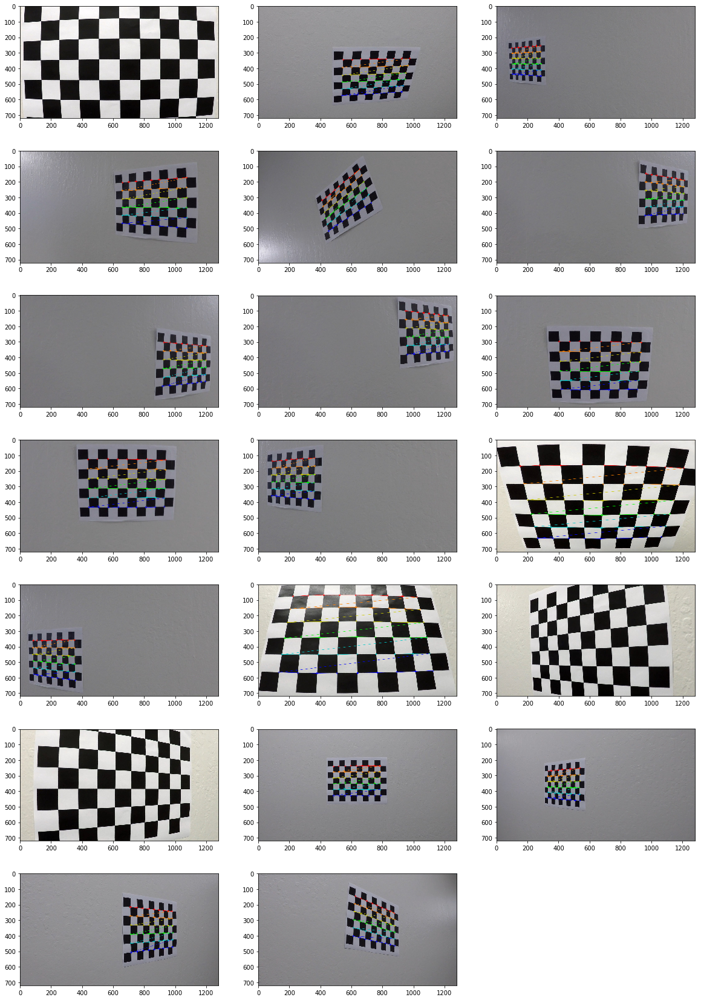

In [6]:
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
cal_images = glob.glob('./camera_cal/calibration*.jpg')

# call the plot to plot the images
plt.figure(figsize=(20, 30))

# number of rows of the plot grid
r = int(np.ceil(len(cal_images) / 3)) 

# Step through the list and search for chessboard corners
for i, fname in enumerate(cal_images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)

    # plot the image. if no pattern was found original is plotted
    plt.subplot(r, 3, i+1) 
    plt.imshow(img[:,:,::-1])


## Undistort the Chessborad Images

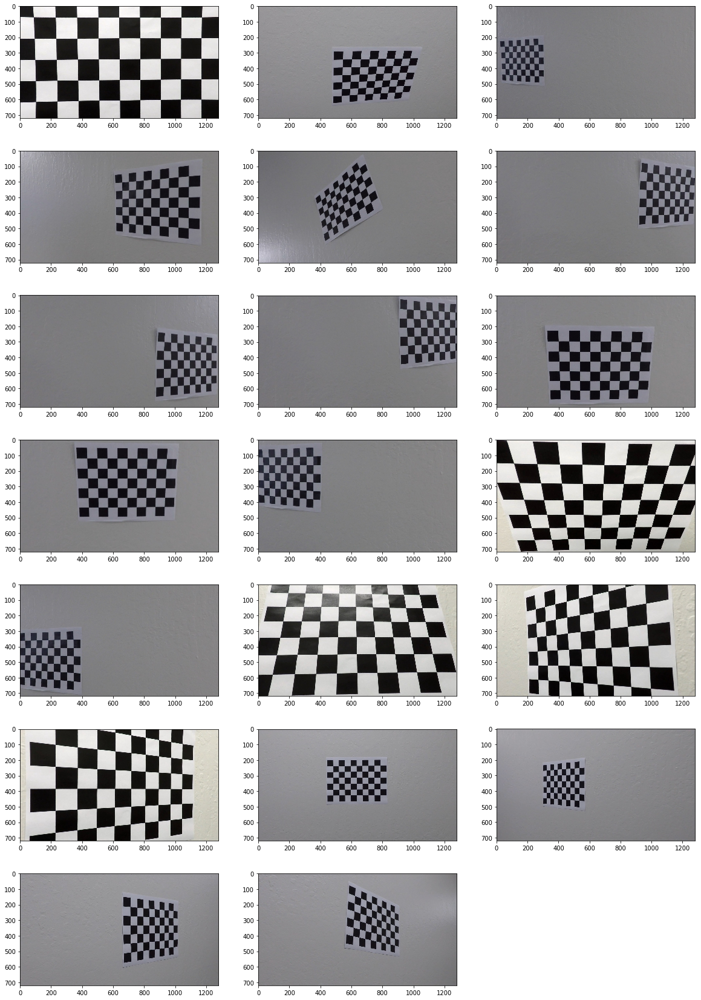

In [9]:
# get calibration data
ret, mat, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[:2], None, None)

# save the calibration data to disk
with open('calib.p', mode='wb') as f:
    pickle.dump([ret, mat, dist, rvecs, tvecs], f, protocol=2)

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    undistorted_img = cv2.undistort(img, mat, dist, None, mat)

    # plot the undistorted image. 
    plt.subplot(r, 3, i+1) 
    plt.imshow(undistorted_img[:,:,::-1])


## Undistort the Test Images

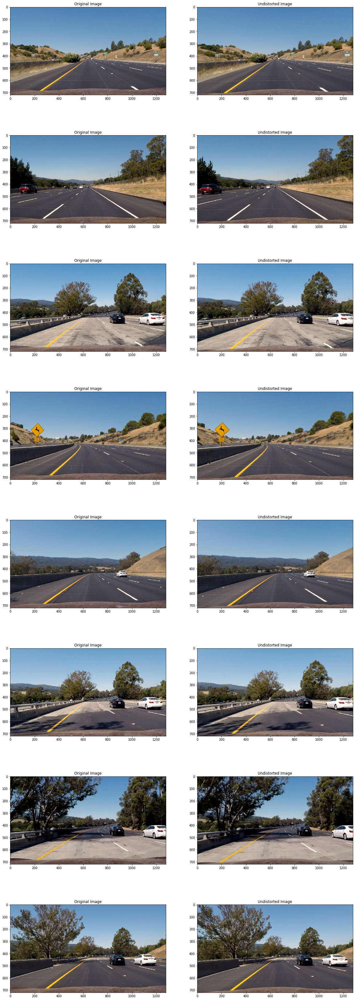

In [19]:
# load the image file names from test images folder
images = glob.glob('./test_images/*.jpg')

# call the plot to plot the images
plt.figure(figsize=(20, 60))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    
    # use the same clibration data from chessbord images to undistort the test images
    undistorted_img = cv2.undistort(img, mat, dist, None, mat)

    # plot the original image. 
    plt.subplot(len(images), 2, 2*i+1) 
    plt.imshow(img[:,:,::-1])
    plt.title("Original Image")
    
    # plot the undistorted image
    plt.subplot(len(images), 2, 2*i+2) 
    plt.imshow(undistorted_img[:,:,::-1])
    plt.title("Undistorted Image")


## Applying a variety of Transformations to images 

In this section, I will apply various filters to the images in order to determine which would be best then to perform lane detection.

### Visualizing images in different channels of RGB, HSV and HSL colorspaces

In [20]:
# only consider test images
images = glob.glob('./test_images/test*.jpg')

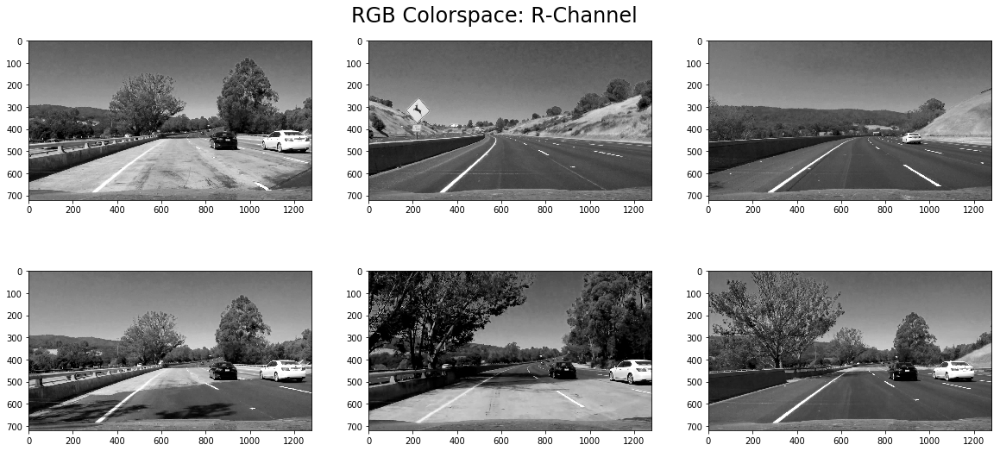

In [44]:
### RGB R-channel

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    plt.subplot(r, 3, i+1)
    plt.imshow(img[...,2], cmap='gray')
    
plt.suptitle("RGB Colorspace: R-Channel", size=24)
plt.subplots_adjust(top=0.97)

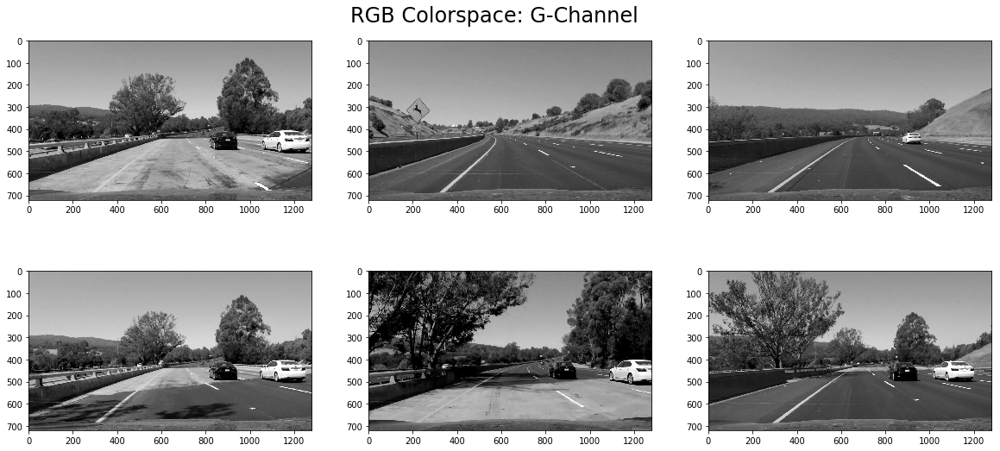

In [45]:
### RGB G-channel

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    plt.subplot(r, 3, i+1)
    plt.imshow(img[...,1], cmap='gray')
    
plt.suptitle("RGB Colorspace: G-Channel", size=24)
plt.subplots_adjust(top=0.97)

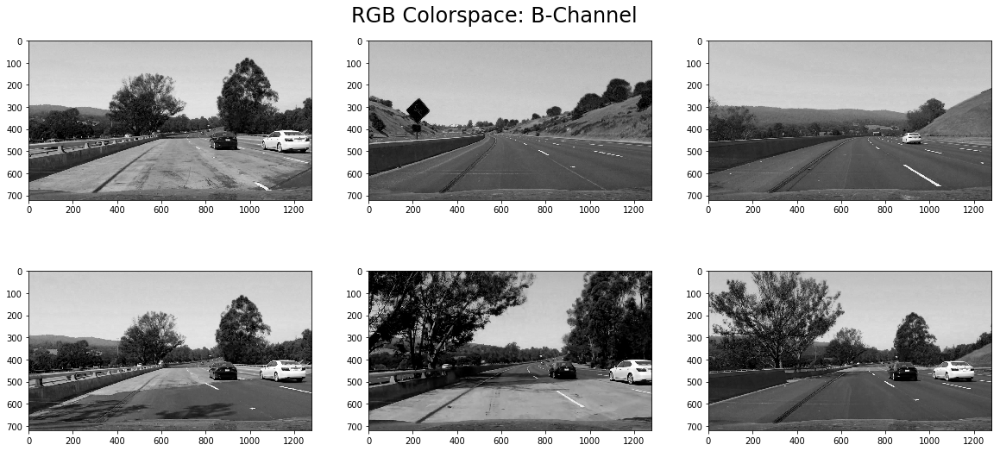

In [46]:
### RGB B-channel

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    plt.subplot(r, 3, i+1)
    plt.imshow(img[...,0], cmap='gray')
    
plt.suptitle("RGB Colorspace: B-Channel", size=24)
plt.subplots_adjust(top=0.97)

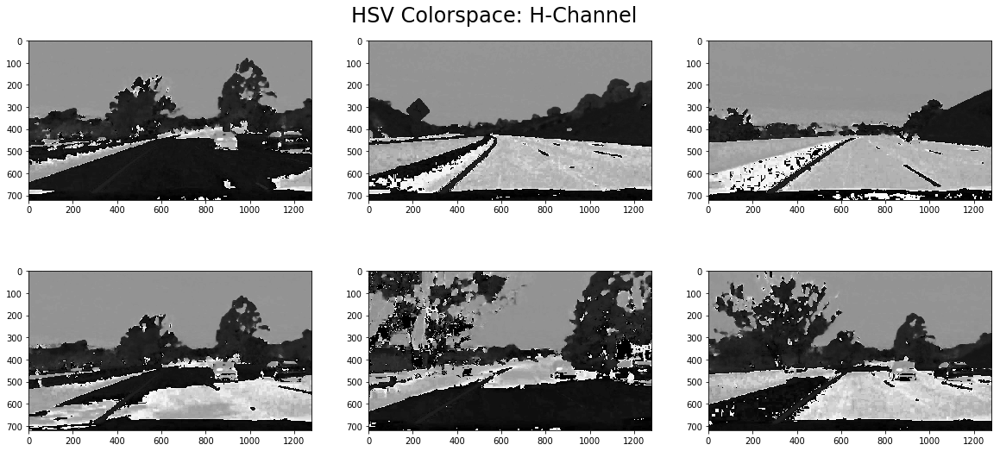

In [47]:
### HSV H-channel

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    plt.subplot(r, 3, i+1)
    plt.imshow(img[...,0], cmap='gray')
    
plt.suptitle("HSV Colorspace: H-Channel", size=24)
plt.subplots_adjust(top=0.97)

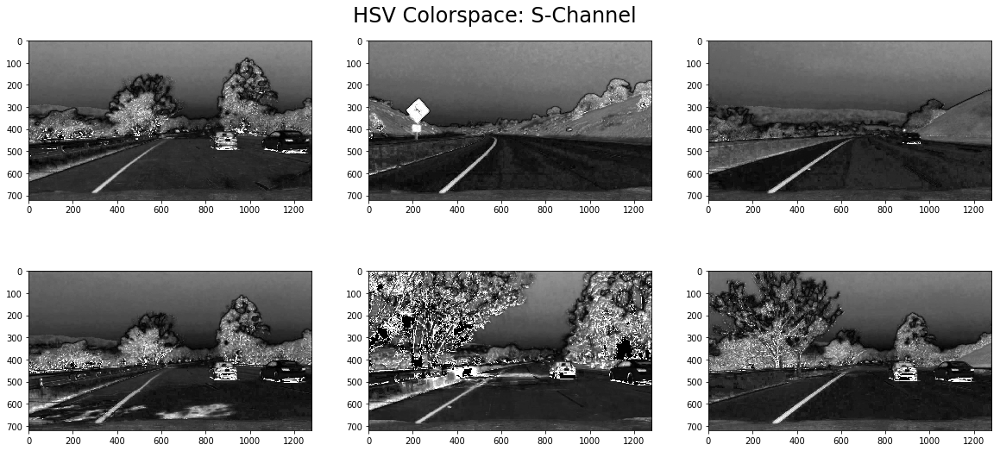

In [48]:
### HSV S-channel

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    plt.subplot(r, 3, i+1)
    plt.imshow(img[...,1], cmap='gray')
    
plt.suptitle("HSV Colorspace: S-Channel", size=24)
plt.subplots_adjust(top=0.97)

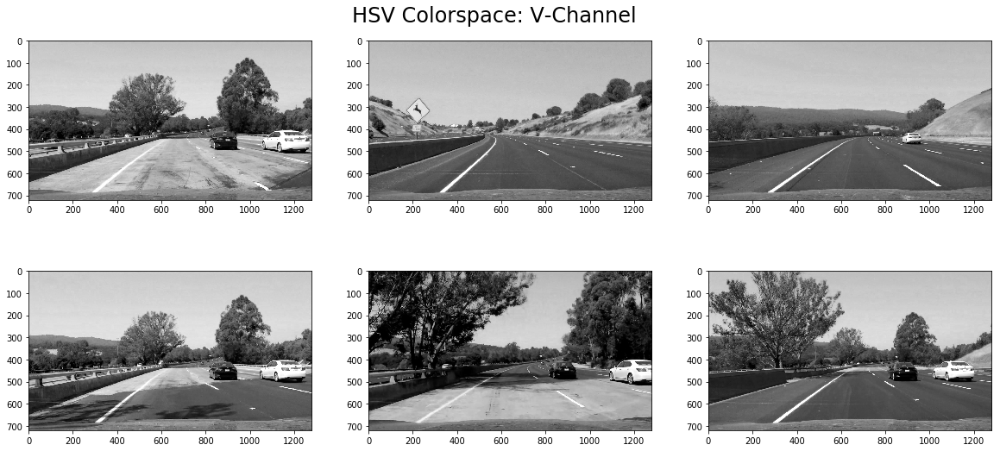

In [49]:
### HSV V-channel

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    plt.subplot(r, 3, i+1)
    plt.imshow(img[...,2], cmap='gray')
    
plt.suptitle("HSV Colorspace: V-Channel", size=24)
plt.subplots_adjust(top=0.97)

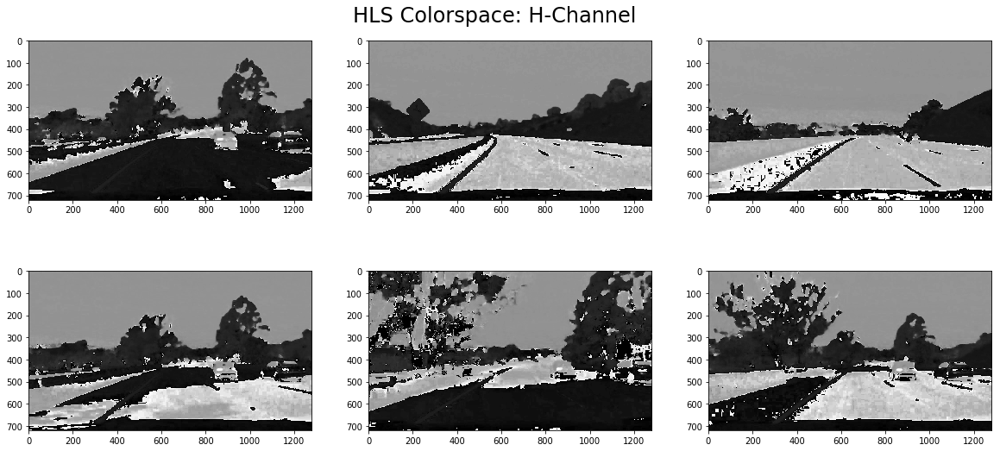

In [53]:
### HLS H-channel

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    plt.subplot(r, 3, i+1)
    plt.imshow(img[...,0], cmap='gray')
    
plt.suptitle("HLS Colorspace: H-Channel", size=24)
plt.subplots_adjust(top=0.97)

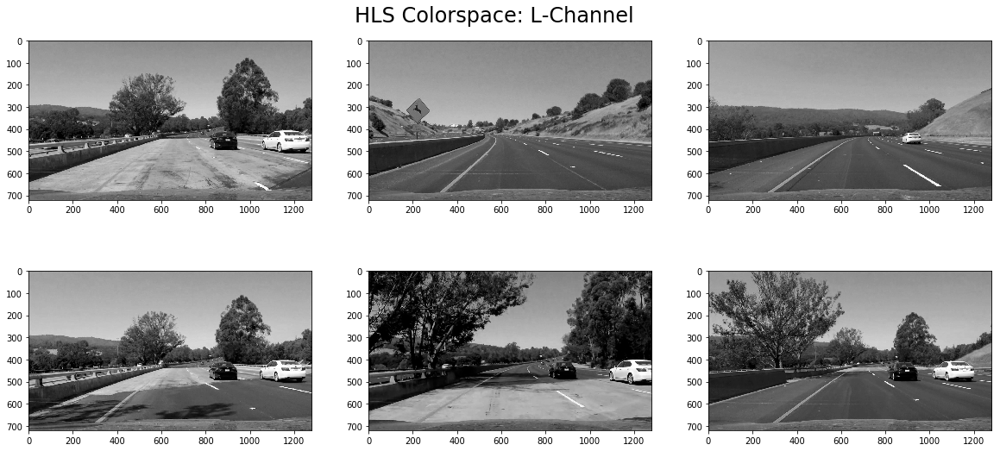

In [54]:
### HLS L-channel

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    plt.subplot(r, 3, i+1)
    plt.imshow(img[...,1], cmap='gray')
    
plt.suptitle("HLS Colorspace: L-Channel", size=24)
plt.subplots_adjust(top=0.97)

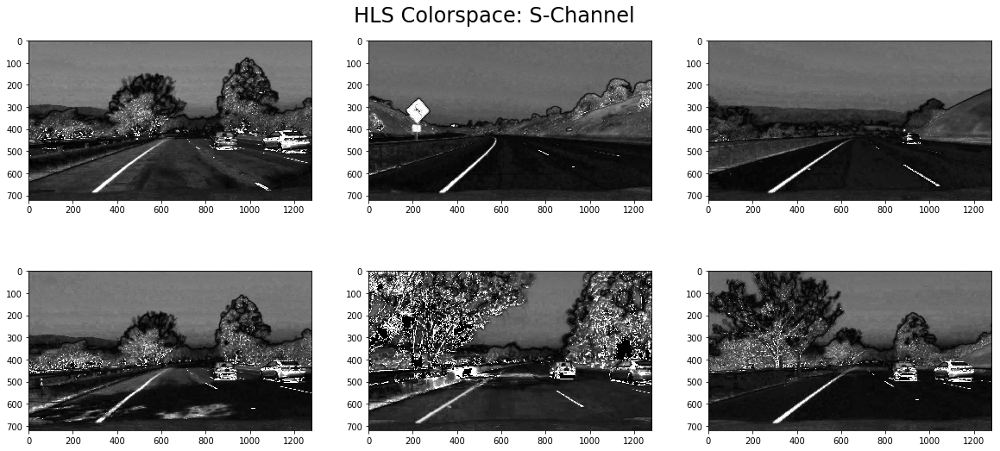

In [55]:
### HLS S-channel

# call the plot to plot the images
plt.figure(figsize=(20, 30))

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    plt.subplot(r, 3, i+1)
    plt.imshow(img[...,2], cmap='gray')
    
plt.suptitle("HLS Colorspace: S-Channel", size=24)
plt.subplots_adjust(top=0.97)

### Applying Gradient-Based Transformation

We can see from the colorspace based filtering that for our purposes, i.e. identifying lane line, the S-Channel in the HLS colorspace provides clear results in all the conditions we found in our test images. Now we can use this information, apply sobel transform to it, evaluate the right threshholds and extract the lane pixels that way.

In [156]:
# Warper function definition

def warper(img, M):

    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped

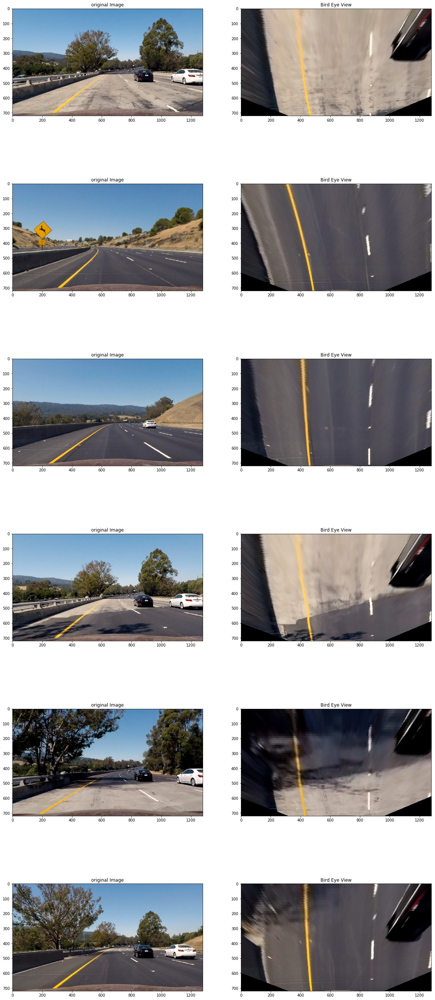

In [170]:
### Apply Perspective transform to the images

# get image height and width
height, width = img.shape[:2]

# set source points 
bottom_left_src = (0.1 * width, 0.95 * height)
bottom_right_src = (0.9 * width, 0.95 * height)
top_left_src = (0.46 * width, 0.65 * height)
top_right_src = (0.58 * width, 0.65 * height)
source = np.float32([bottom_left_src, bottom_right_src, top_left_src, top_right_src])

# set destination pints
bottom_left_dst = (0.3 * width, height)
bottom_right_dst = (0.7 * width, height)
top_left_dst = (0.3 * width, 0) 
top_right_dst = (0.7 * width, 0)
dest = np.float32([bottom_left_dst, bottom_right_dst, top_left_dst, top_right_dst])

# calculate the perspectuve transformation matrix and its inverse
M = cv2.getPerspectiveTransform(source, dest)
invM = cv2.getPerspectiveTransform(dest, source)

# initialize plot grid
plt.figure(figsize=(20, 50))

# loop through test images
for i, fname in enumerate(images):
    #read image
    img = cv2.imread(fname)
    # undistort
    img = cv2.undistort(img, mat, dist, None, mat)
    # plot image
    plt.subplot(len(images), 2, 2*i+1) 
    plt.imshow(img[...,::-1])
    plt.title("original Image")
    # get bird eye view using perspective transform
    bird_eye = warper(img[...,::-1], M)
    # plot bird eye view
    plt.subplot(len(images), 2, 2*i+2) 
    plt.imshow(bird_eye)
    plt.title("Bird Eye View")


In [46]:
### Apply HLS S-channel thresholds to extract the lanes

# save bird eye images to array for quicker access
bird_eyes = np.empty(shape=((0,) + (height, width)), dtype=np.uint8)

for i, fname in enumerate(images):
    #read image
    img = cv2.imread(fname)
    # convert to HLS, and extract S channel
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[...,2]
    # undistort
    img = cv2.undistort(img, mat, dist, None, mat)
    # get bird eye view using perspective transform
    bird_eye = warper(img, M, source, dest)
    # append to bird_eyes array
    bird_eyes = np.concatenate((bird_eyes, bird_eye.reshape(((1,) + (height, width)))))


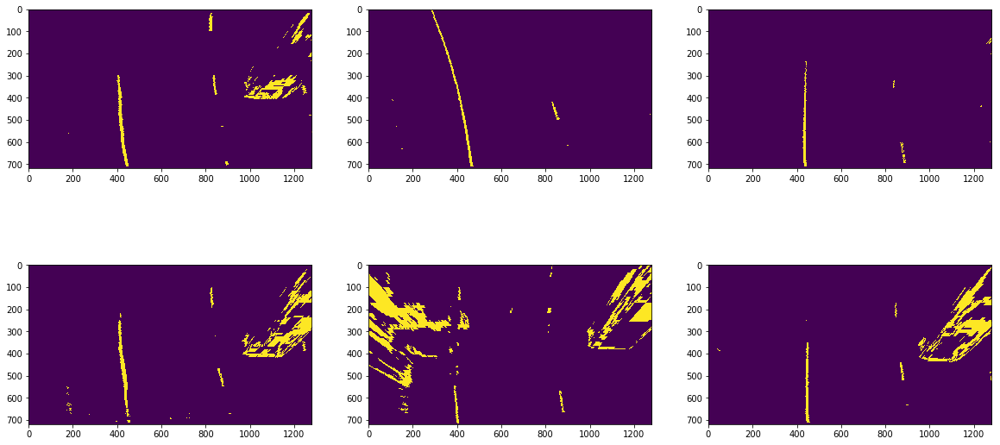

In [73]:
from ipywidgets import interact, interactive, fixed

def evaluate_hsl_s_thresh(min_thresh, max_thresh):
    
    binary_output = np.zeros_like(bird_eyes)
    binary_output[(bird_eyes > min_thresh) & (bird_eyes <= max_thresh)] = 1
    
    fig, axes = plt.subplots(2, 3, figsize=(20,10))
    for i, ax in enumerate(axes.ravel()):
        ax.imshow(binary_output[i])

interact(evaluate_hsl_s_thresh, min_thresh=(0,255), max_thresh=(0,255))

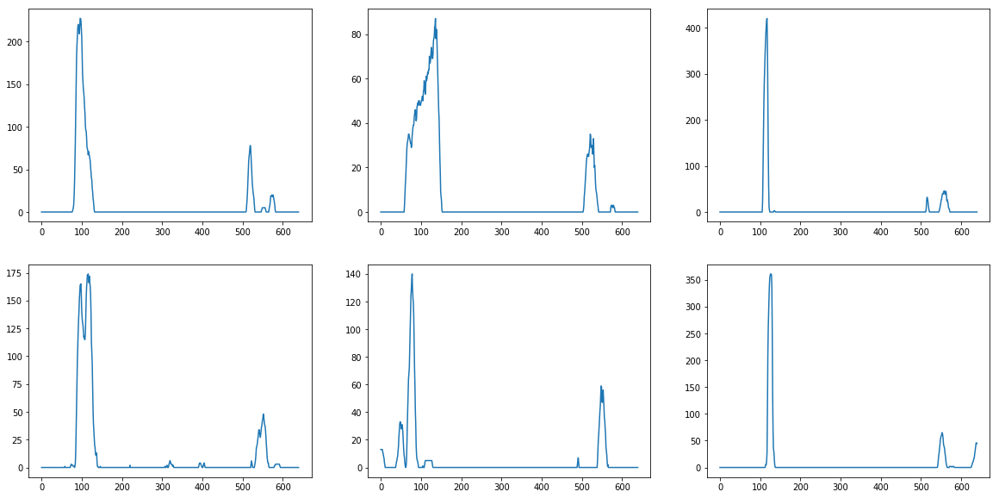

In [124]:
## Create histograms to identify peaks

# thresholds for HLS S-channel filtering 
min_thresh, max_thresh = (180, 255)

# binary outputs 
binary_output = np.zeros_like(bird_eyes)
binary_output[(bird_eyes > min_thresh) & (bird_eyes <= max_thresh)] = 1

# binary image cropping dimensions to filter out the noisy top, right and left sides of the binary output
top_crop = int(0.4 * height)
right_crop = int(0.75 * width)
left_crop = int(0.25 * width)

# initialize plot grid
fig, axes = plt.subplots(2, 3, figsize=(20,10))
for i, ax in enumerate(axes.ravel()):
    hsl_binary = binary_output[i]
    hsl_binary = hsl_binary[top_crop:, left_crop:right_crop]
    histogram = np.sum(hsl_binary, axis=0)
    ax.plot(histogram)


In [157]:
# Define method to fit polynomial to binary image with lines extracted, using sliding window

def polyfit_binary(img):
    
    # Set crop factors separetly to recontruct the image accordingly
    top_crop_factor = 0.4
    right_crop_factor = 0.75
    left_crop_factor = 0.25
    
    height, width = img.shape[:2]
    
    # Set crop lengths based on crop factors
    top_crop = int(top_crop_factor * height)
    right_crop = int(right_crop_factor * width)
    left_crop = int(left_crop_factor * width)
    
    # Take a histogram of the crop of the image
    histogram = np.sum(img[top_crop:, left_crop:right_crop], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = int(histogram.shape[0]//2)

    leftx_base = np.argmax(histogram[:midpoint]) + left_crop 
    rightx_base = np.argmax(histogram[midpoint:]) + left_crop + midpoint
    
    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 40
    # Set minimum number of pixels found to recenter window
    minpix = 20
    # Create empty lists to receive left and right lane pixel indices
    left_inds = []
    right_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_inds.append(good_left_inds)
        right_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_inds = np.concatenate(left_inds)
    right_inds = np.concatenate(right_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_inds]
    lefty = nonzeroy[left_inds] 
    rightx = nonzerox[right_inds]
    righty = nonzeroy[right_inds] 

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    stats = (rectangle_data, histogram)
    
    return left_fit, right_fit, left_inds, right_inds, stats


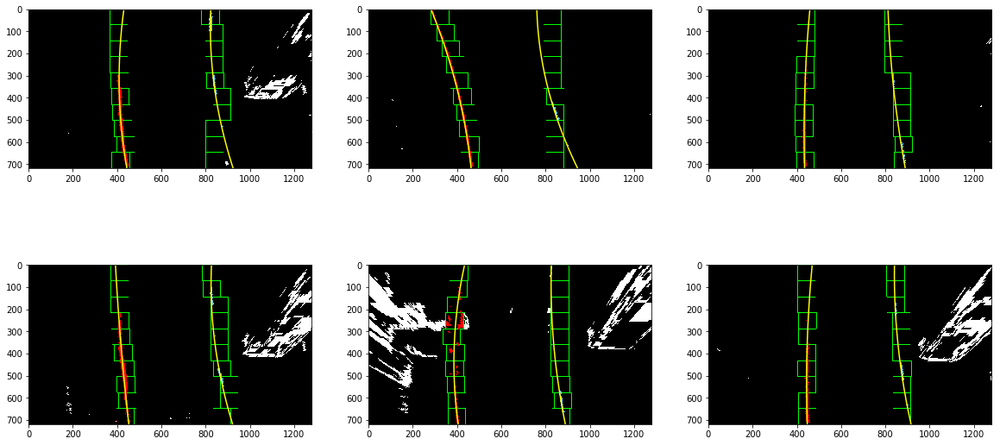

In [135]:
## Fit the polynomial onto the binary image and visualize on each of the test images

fig, axes = plt.subplots(2, 3, figsize=(20,10))

for i in range(len(binary_output)):
    
    binary_img = binary_output[i]

    left_fit, right_fit, left_inds, right_inds, stats = polyfit_binary(binary_img)

    left_fit_x_int = left_fit[0]*height**2 + left_fit[1]*height + left_fit[2]
    right_fit_x_int = right_fit[0]*height**2 + right_fit[1]*height + right_fit[2]

    rectangles = stats[0]
    histogram = stats[1]

    # Create an output image to draw on and  visualize the result
    out_img = np.uint8(np.dstack((binary_img, binary_img, binary_img))*255)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_img.shape[0]-1, binary_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    for rect in rectangles:
    # Draw the windows on the visualization image
        cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
        cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_inds], nonzerox[left_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_inds], nonzerox[right_inds]] = [100, 200, 255]
    
    # Plot the results 
    ax = axes.ravel()[i]
    ax.imshow(out_img)
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')



In [140]:
## Definition of the funtion to calulate curvature and center offset

def curvature_n_offset(left_fit, right_fit, binary_warped):
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    y_eval = np.max(ploty)
    
    # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    ym_per_pix = 3.048/100
    # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    xm_per_pix = 3.7/378 
    
    # Calculate the new radii of curvature
    left_radius = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_radius = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    center_offset = (((left_fit[0]*720**2+left_fit[1]*720+left_fit[2]) +(right_fit[0]*720**2+right_fit[1]*720+right_fit[2]) ) /2 - 640)*xm_per_pix
    
    # return radius of curvature for left and right lanes and the center offset
    return left_radius, right_radius, center_offset

In [142]:
### Print curvature and offset information of the test images

for i, image in enumerate(binary_output):
    
    left_fit, right_fit, left_inds, right_inds, stats = polyfit_binary(image)
    left_radius, right_radius, center_offset = curvature_n_offset(left_fit, right_fit, image)
    
    print("----- Test Image {} ------".format(i+1))
    print("Left Lane Curvature: {} meters.".format(left_radius))
    print("Right Lane Curvature: {} meters.".format(right_radius))
    print("Center Offset: {} meters.".format(center_offset))
    print()

----- Test Image 1 ------
Left Lane Curvature: 2373.830941297907 meters.
Right Lane Curvature: 1963.7899732054348 meters.
Center Offset: 0.43365524592377186 meters.

----- Test Image 2 ------
Left Lane Curvature: 2952.2210912566543 meters.
Right Lane Curvature: 1569.2371486750787 meters.
Center Offset: 0.633703932397968 meters.

----- Test Image 3 ------
Left Lane Curvature: 6164.781634098232 meters.
Right Lane Curvature: 4858.962435039031 meters.
Center Offset: 0.2214228457098249 meters.

----- Test Image 4 ------
Left Lane Curvature: 11896.731336244815 meters.
Right Lane Curvature: 2061.5904151051586 meters.
Center Offset: 0.4640725304387098 meters.

----- Test Image 5 ------
Left Lane Curvature: 2155.4676897000822 meters.
Right Lane Curvature: 3118.367234626928 meters.
Center Offset: 0.07309477213405732 meters.

----- Test Image 6 ------
Left Lane Curvature: 5665.015131207659 meters.
Right Lane Curvature: 3038.0655421385704 meters.
Center Offset: 0.4075686410943834 meters.



In [184]:
# Define function to reproject lanes back onto the original image

def reproject_lanes(img, binary, left_fit, right_fit, invM):
    
    new_img = np.copy(img)
    
    if left_fit is None or right_fit is None:
        return img
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (255,0, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(0,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (invM)
    newwarp = cv2.warpPerspective(color_warp, invM, (w, h)) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    
    return result

/home/aqeel/anaconda3/envs/carnd/lib/python3.5/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


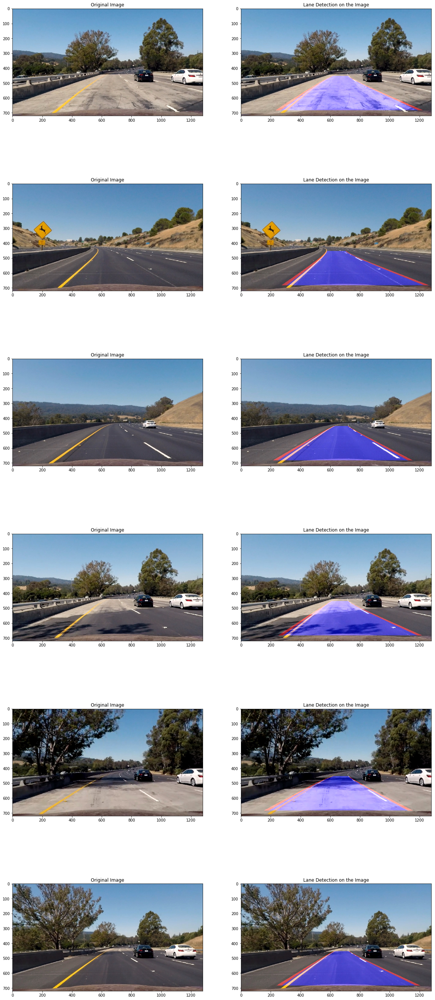

In [154]:
### Visualize the result of reprojected lanes onto the original test images

# initialize plot grid
plt.figure(figsize=(20, 50))
plt.subplot(len(images), 2, 2*i+2) 

# loop through test images
for i, fname in enumerate(images):
    
    #read image
    img = cv2.imread(fname)
    
    # undistort
    img = cv2.undistort(img, mat, dist, None, mat)
    
    # plot image
    plt.subplot(len(images), 2, 2*i+1) 
    plt.imshow(img[...,::-1])
    plt.title("Original Image")
    
    # get corresponding binary image from the saved array
    binary_img = binary_output[i]
    
    # Get polyfit parameters
    left_fit, right_fit, left_inds, right_inds, stats = polyfit_binary(binary_img)
    
    # get reptojected image
    reprojected_img = reproject_lanes(img, binary_img, left_fit, right_fit, invM)
    
    plt.subplot(len(images), 2, 2*i+2) 
    plt.imshow(reprojected_img[...,::-1])
    plt.title("Lane Detection on the Image")
    

In [183]:
### FINALLY the whole pipeline is define by the following function

# load calibration data
with open('calib.p', mode='rb') as f:
    ret, mat, dist, rvecs, tvecs = pickle.load(f)

def compute_perspective_matrices(height, width):
    # set source points 
    bottom_left_src = (0.1 * width, 0.95 * height)
    bottom_right_src = (0.9 * width, 0.95 * height)
    top_left_src = (0.46 * width, 0.65 * height)
    top_right_src = (0.58 * width, 0.65 * height)
    source = np.float32([bottom_left_src, bottom_right_src, top_left_src, top_right_src])

    # set destination pints
    bottom_left_dst = (0.3 * width, height)
    bottom_right_dst = (0.7 * width, height)
    top_left_dst = (0.3 * width, 0) 
    top_right_dst = (0.7 * width, 0)
    dest = np.float32([bottom_left_dst, bottom_right_dst, top_left_dst, top_right_dst])
    
    # calculate the perspectuve transformation matrix and its inverse
    M = cv2.getPerspectiveTransform(source, dest)
    invM = cv2.getPerspectiveTransform(dest, source)
    
    return M, invM
    
# function definition
def pipeline(image):
    
    # undistort the image
    undistorted_img = cv2.undistort(image, mat, dist, None, mat)
    
    # convert to HLS and get only S-channel
    hls_img = cv2.cvtColor(undistorted_img, cv2.COLOR_RGB2HLS)[...,2]
    
    # get image height and width
    height, width = image.shape[:2]
    
    # calculate perspective matix and its inverse along with source and destination points
    M, invM = compute_perspective_matrices(height, width)
    
    # create bird eye view of the image
    bird_eye = warper(hls_img, M)
    
    # set threshols for hls s-channel filtering
    min_thresh, max_thresh = (180, 255)
    
    #create binary output
    binary_img = np.zeros_like(bird_eye)
    binary_img[(bird_eye > min_thresh) & (bird_eye <= max_thresh)] = 1
    
    # perform polyfit on lanes
    left_fit, right_fit, left_inds, right_inds, stats = polyfit_binary(binary_img)
    
    # compute left and right radius and center offset
    left_radius, right_radius, center_offset = curvature_n_offset(left_fit, right_fit, binary_img)
    
    # reproject detected lanes onto original undistorted image
    reprojected_img = reproject_lanes(undistorted_img, binary_img, left_fit, right_fit, invM)
    
    # Add curvature and center offset info on frame
    left_curv = "Left curvature: " + str(int(left_radius)) + " meters"
    right_curv = "Right curvature: " + str(int(right_radius))+ " meters"
    center_offset = "Center offset: " + str(round( center_offset,2)) + "meters"
    
    cv2.putText(reprojected_img, left_curv, (50,50), cv2.FONT_HERSHEY_COMPLEX, 0.8,(255,255,255), 1,  lineType = cv2.LINE_AA)
    cv2.putText(reprojected_img, right_curv, (50,75), cv2.FONT_HERSHEY_COMPLEX, 0.8,(255,255,255), 1,  lineType = cv2.LINE_AA)
    cv2.putText(reprojected_img, center_offset, (50,100), cv2.FONT_HERSHEY_COMPLEX, 0.8,(255,255,255), 1,  lineType = cv2.LINE_AA)
    
    return reprojected_img
    

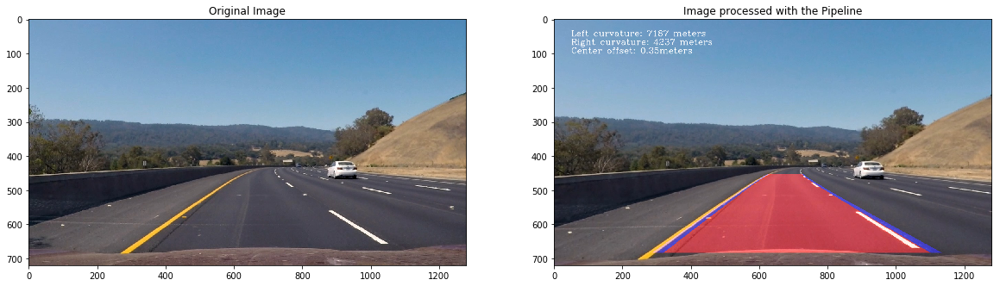

In [167]:
### Pipeline test

image = cv2.imread(np.random.choice(images))[...,::-1]
processed_img = pipeline(image)

plt.figure(figsize=(20,50))

plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(processed_img)
plt.title("Image processed with the Pipeline")

print()

In [178]:
# Import everything needed to edit/save/watch video clips
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import moviepy as mvp

In [185]:
video_output1 = 'project_video_result.mp4'
video_input1 = VideoFileClip('project_video.mp4')#.subclip(22,26)
processed_video = video_input1.fl_image(pipeline)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing video project_video_result.mp4


 47%|████▋     | 598/1261 [00:58<01:04, 10.23it/s]

TypeError: 'NoneType' object is not subscriptable

 47%|████▋     | 598/1261 [01:10<01:17,  8.54it/s]

In [ ]:
HTML("""
<video  width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))